In [65]:
import os
import sys
import glob
import h5py
import time
import numpy as np
import matplotlib
import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.dates as mdates

from copy import copy
from scipy import linalg
from datetime import datetime, timedelta
from mintpy.objects import timeseries
from mintpy.tsview import timeseriesViewer
from mintpy.utils import readfile, utils as ut, plot as pp
from mintpy import view, tsview, plot_network, plot_transection, plot_coherence_matrix
matplotlib.rcParams.update({'font.size': 16})

from sklearn.linear_model import LinearRegression

In [60]:
def read_mask(mask_file):
    mask_data = readfile.read(mask_file)[0]
    mask = mask_data==1
    return 1*mask

def read_img(fname, mask):
    # The dataset unit is meter
    v     = readfile.read(fname, datasetName='velocity')[0]*1000     # Unit: mm/y
    #meta  = readfile.read(fname, datasetName='velocity')[1]          # metadata
    #v_std = readfile.read(fname, datasetName='velocityStd')[0] *1000  # Unit: mm/y

    # read mask and mask the dataset
    mask_file = mask   # 'waterMask.h5' or 'maskTempCoh.h5'
    mask_data = readfile.read(mask_file)[0]
    v[mask_data==0] = np.nan
    #v_std[mask_data==0] = np.nan
    #water_mask = readfile.read('../../waterMask.h5')[0]
    return v


def read_stack(fname, dset, mask):
    # metadata
    dsname4atr = None   #used to determine UNIT
    if isinstance(dset, list):
        dsname4atr = dset[0].split('-')[0]
    elif isinstance(dset, str):
        dsname4atr = dset.split('-')[0]
    meta = readfile.read_attribute(fname, datasetName=dsname4atr)
    #print(meta)

    length = int(meta['LENGTH'])
    width  = int(meta['WIDTH'])

    # the default value for ifgramStack.h5 is the isce2 default, so in [radian], range increase is postive
    v      = readfile.read_hdf5_file(fname, datasetName=dset, box=[0,0,width,length])

    # read mask and mask the dataset
    mask_file = mask   # 'waterMask.h5' or 'maskTempCoh.h5'
    mask_data = readfile.read(mask_file)[0]
    v[mask_data==0] = np.nan
    return v


def est_ramp(data, ramp_type='linear', mask='none'):
    width, length = data.shape
    # design matrix
    xx, yy = np.meshgrid(np.arange(0, width),
                         np.arange(0, length))
    xx = np.array(xx, dtype=np.float32).reshape(-1, 1)
    yy = np.array(yy, dtype=np.float32).reshape(-1, 1)
    ones = np.ones(xx.shape, dtype=np.float32)

    if ramp_type == 'linear':
        G = np.hstack((yy, xx, ones))
    elif ramp_type == 'quadratic':
        G = np.hstack((yy**2, xx**2, yy*xx, yy, xx, ones))
    elif ramp_type == 'linear_range':
        G = np.hstack((xx, ones))
    elif ramp_type == 'linear_azimuth':
        G = np.hstack((yy, ones))
    elif ramp_type == 'quadratic_range':
        G = np.hstack((xx**2, xx, ones))
    elif ramp_type == 'quadratic_azimuth':
        G = np.hstack((yy**2, yy, ones))
    else:
        raise ValueError('un-recognized ramp type: {}'.format(ramp_type))

    # estimate ramp
    mask = mask.flatten()
    X = np.dot(np.linalg.pinv(G[mask, :], rcond=1e-15), data[mask, :])
    ramp = np.dot(G, X)
    ramp = np.array(ramp, dtype=data.dtype)

    data_out = data - ramp
    return data_out, ramp

def linear_fit(x, y):
    # Create an instance of a linear regression model and fit it to the data with the fit() function:
    model = LinearRegression().fit(x, y)
    # Obtain the coefficient of determination by calling the model with the score() function, then print the coefficient:
    r_sq = model.score(x, y)
    print('coefficient of determination:', r_sq)
    print('slope:', model.coef_[0])
    print('intercept:', model.intercept_)
    y_pred = model.predict(x)
    return model, y_pred

def flatten_isnotnan(x):
    x = x.flatten()[~np.isnan(x.flatten())]
    return x

def dem_shading(dem, shade_azdeg=315, shade_altdeg=45, shade_exag=0.5, shade_min=-2e3, shade_max=3e3):
    # prepare shade relief
    import warnings
    from matplotlib.colors import LightSource
    from mintpy.objects.colors import ColormapExt

    ls = LightSource(azdeg=shade_azdeg, altdeg=shade_altdeg)
    with warnings.catch_warnings():
        warnings.simplefilter("ignore", category=RuntimeWarning)
        dem_shade = ls.shade(dem, vert_exag=shade_exag, cmap=ColormapExt('gray').colormap, vmin=shade_min, vmax=shade_max)
    dem_shade[np.isnan(dem_shade[:, :, 0])] = np.nan
    return dem_shade


def wrapper(v, wraprange=np.pi):
    # wrap values around `wraprange`
    wrap_v = (v + wraprange) % (2 * wraprange) - wraprange
    return wrap_v


def plot_imgs(v, meta, dem=None, vlims=[[None, None]], bbox=[None]*4, unit='mm/yr', inter='antialiased', cmap='RdYlBu_r', picdir='./pic', outf='img001'):
    from mpl_toolkits.axes_grid1.inset_locator import inset_axes
    font_size=16
    plt.rcParams.update({'font.size': font_size})

    ## get attributes
    length    = int(meta['LENGTH'])
    width     = int(meta['WIDTH'])
    x_min     = float(meta['X_FIRST'])
    x_step    = float(meta['X_STEP'])
    y_min     = float(meta['Y_FIRST'])
    y_step    = float(meta['Y_STEP'])
    lats      = np.arange(y_min,length*y_step+y_min, y_step)
    lons      = np.arange(x_min, width*x_step+x_min, x_step)
    ref_lat   = float(meta['REF_LAT'])
    ref_lon   = float(meta['REF_LON'])
    geo_extent= [lons[0],lons[-1],lats[-1],lats[0]]

    nrows, ncols = 1, len(v)
    keys = v.keys()

    fig, axs = plt.subplots(nrows=nrows, ncols=ncols, figsize=[ncols*8,12], sharey=True, gridspec_kw={'wspace':0.02})
    if len(v) == 1:
        axs = [axs]
    if len(vlims) != len(axs):
        vlims.append([None,None]*(len(axs)-len(vlims)))

    for i, (ax, k, vlim) in enumerate(zip(axs, keys, vlims)):
        # plot DEM and the image
        if dem is not None:
            ie = ax.imshow(dem, extent=geo_extent, vmin=-500, vmax=2000)
        im = ax.imshow(v[k],    extent=geo_extent, cmap=cmap, vmin=vlim[0], vmax=vlim[1], alpha=0.6, interpolation=inter)

        # colorbar
        high_val = np.nanpercentile(v[k], 99.8)
        low_val  = np.nanpercentile(v[k],  0.2)
        cbck = inset_axes(ax, width="60%", height="7.5%", loc='lower left',
                bbox_transform=ax.transAxes, bbox_to_anchor=(-0.02,-0.015,1,1))    # colorbar background
        cbck.set_facecolor('w')
        cbck.patch.set_alpha(0.7)
        cbck.get_xaxis().set_visible(False)
        cbck.get_yaxis().set_visible(False)
        cbar = inset_axes(cbck, width="90%", height="45%",loc='upper center',
                bbox_transform=cbck.transAxes, bbox_to_anchor=(0, 0.1, 1, 1))
        fig.colorbar(im, cax=cbar, orientation='horizontal')
        cbar.text(0.5, 0.5, unit, ha='center', va='center', fontsize=16, transform=cbar.transAxes)
        cbar.text(0.02, 0.5, '({:.1f})'.format(low_val),   ha='left', va='center', fontsize=12, transform=cbar.transAxes)
        cbar.text(0.98, 0.5, '({:.1f})'.format(high_val), ha='right', va='center', fontsize=12, transform=cbar.transAxes)

        # scale bar & xlabel
        if i == 0:
            if not all(x is None for x in bbox):
                cent_lat = np.mean(bbox[2:])
                span_lon = bbox[1]-bbox[0]
            else:
                cent_lat = np.mean(lats)
                span_lon = np.max(lons)-np.min(lons)
            r_earth    = 6378.1370
            km_per_lon = np.pi/180 * r_earth * np.cos(np.pi*cent_lat/180)
            span_km    = span_lon * km_per_lon
            scal_km    = round(span_km/3/10)*10
            scal_lon   = scal_km / km_per_lon
            scax  = inset_axes(ax, width=scal_lon, height="1%", loc='upper left',
                    bbox_transform=ax.transAxes, bbox_to_anchor=(0.04, -0.03, 1, 1))
            scax.set_facecolor('k')
            scax.axes.xaxis.set_ticks([])
            scax.axes.yaxis.set_ticks([])
            scax.set_xlabel('{:d} km'.format(scal_km), fontsize=16, labelpad=2)
            ax.set_ylabel('Latitude', fontsize=font_size+4)

        # reference point if available
        if ref_lon and ref_lat:
            ax.scatter(ref_lon, ref_lat, marker='s', s=50, c='k')

        # others
        ax.set_title(k)
        ax.set_xlabel('Longitude', fontsize=font_size+4)
        ax.set_xlim(bbox[0], bbox[1])
        ax.set_ylim(bbox[2], bbox[3])

    # output
    if not os.path.exists(picdir):
        os.makedirs(picdir)
    out_file = f'{picdir}/{outf}.png'
    plt.savefig(out_file, bbox_inches='tight', transparent=True, dpi=300)
    print('save to file: '+out_file)
    plt.show()


def scatter_fields(data1, data2, labels=['data1','data2'], vlim=[-20,20], title='', savedir=False):
    ## linear fit to the trend
    x = flatten_isnotnan(data1)
    y = flatten_isnotnan(data2)
    model, y_pred = linear_fit(x.reshape(-1, 1), y)

    # plot
    plt.figure(figsize=[6,6])
    plt.scatter(x, y)
    plt.scatter(x, y_pred, s=0.3, label='y=ax+b \n a={:.3f}, b={:.3f}'.format(model.coef_[0], model.intercept_))
    plt.xlabel(labels[0])
    plt.ylabel(labels[1])
    plt.ylim(vlim[0], vlim[1])
    plt.legend(loc='upper left')
    plt.title(title)
    if savedir is not False:
        if not os.path.exists(savedir):
            os.makedirs(savedir)
        # output
        out_file = f'{savedir}/{title}.png'
        plt.savefig(out_file, bbox_inches='tight', transparent=True, dpi=300)
        print('save to file: '+out_file)
        plt.close()
    else:
        plt.show()



In [4]:
## define files

maskfile  = '../../maskTempCoh_high.h5'
dem       = np.array(readfile.read('/marmot-nobak/ykliu/aqaba/broad_dem/dem_resamp_a087/a087.dem')[0], dtype=float)
dem_shade = dem_shading(dem, shade_exag=0.1)
meta      = readfile.read('velocity1.h5', datasetName='velocity')[1]


<ipython-input-60-fadd76e93eb6>:108: RuntimeWarning: invalid value encountered in remainder
  wrap_v = (v + wraprange) % (2 * wraprange) - wraprange


save to file: ./pic/tmp_topsApp_20150328_20150409.png


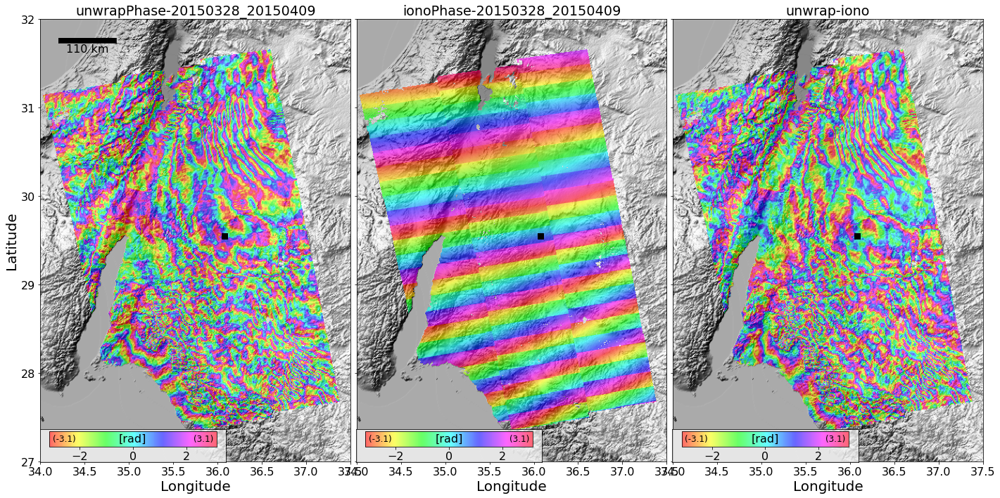

save to file: ./pic/tmp_topsApp_wrap20150328_20150409.png


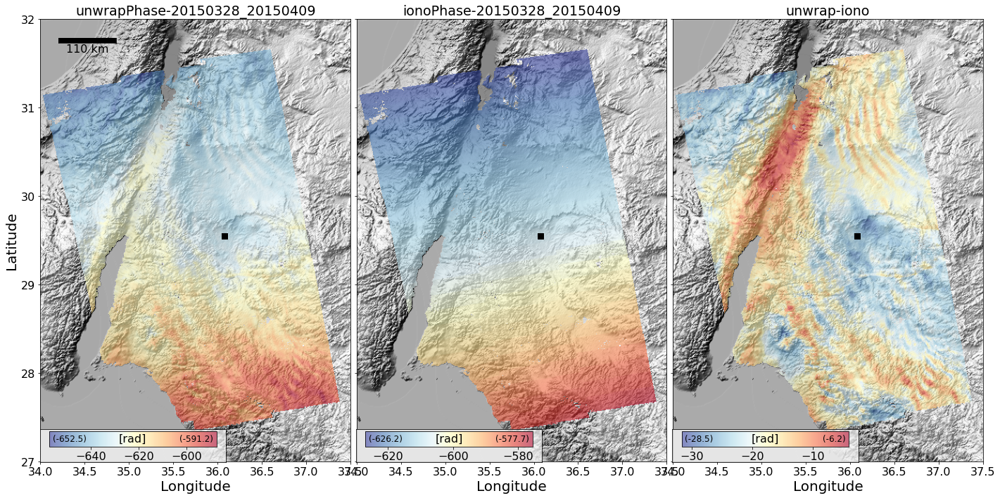

In [63]:
pair = '20150328_20150409'

maskfile  = '../../maskTempCoh_high.h5'
dem       = np.array(readfile.read('/marmot-nobak/ykliu/aqaba/broad_dem/dem_resamp_a087/a087.dem')[0], dtype=float)
dem_shade = dem_shading(dem, shade_exag=0.1)
stackfile  = '../../inputs/ifgramStack.h5'
meta = readfile.read(stackfile, datasetName='unwrapPhase')[1]

phi = dict()
phi['unwrapPhase-'+pair] = read_stack(stackfile, 'unwrapPhase-'+pair, maskfile)
phi['ionoPhase-'+pair]   = read_stack(stackfile,   'ionoPhase-'+pair, maskfile)
phi['unwrap-iono'] = phi['unwrapPhase-'+pair] - phi['ionoPhase-'+pair]

phi_wrap = dict()
for key in phi:
    phi_wrap[key] = wrapper(phi[key], wraprange=np.pi)

plot_imgs(phi_wrap, meta, dem_shade, bbox=[34,37.5,27,32], unit='[rad]', cmap='hsv', inter='nearest', outf='tmp_topsApp_'+pair)
plot_imgs(phi, meta, dem_shade, bbox=[34,37.5,27,32], unit='[rad]', inter='nearest', outf='tmp_topsApp_wrap'+pair)

<ipython-input-60-fadd76e93eb6>:108: RuntimeWarning: invalid value encountered in remainder
  wrap_v = (v + wraprange) % (2 * wraprange) - wraprange


save to file: ./pic/tmp_topsStack_20150328_20150409.png


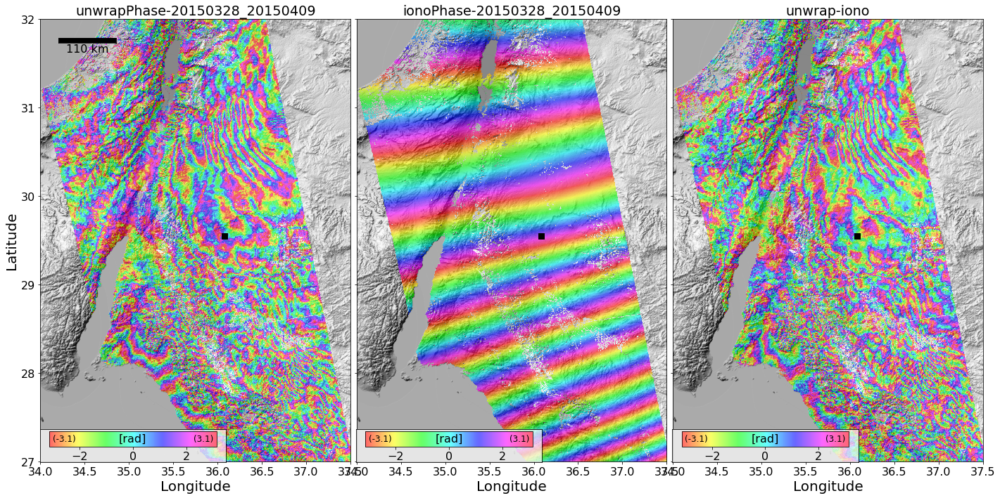

save to file: ./pic/tmp_topsStack_wrap20150328_20150409.png


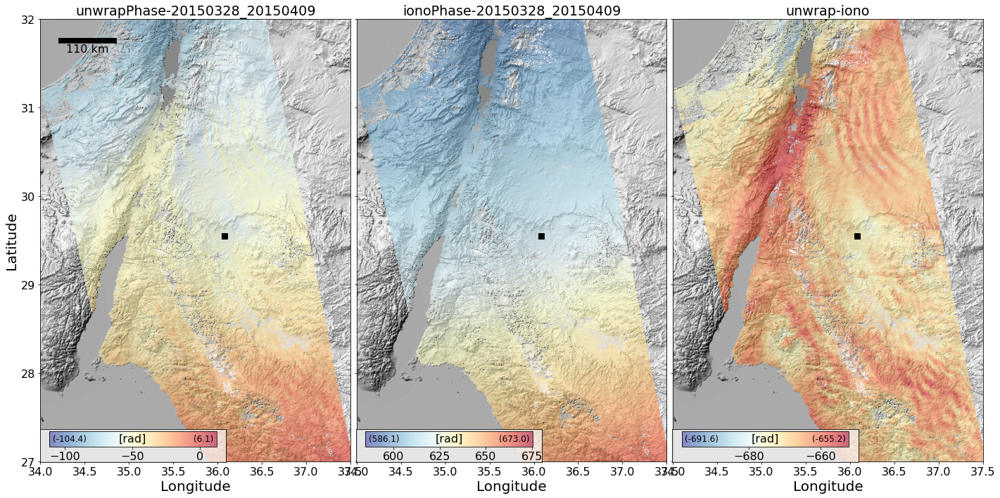

In [64]:
pair = '20150328_20150409'

maskfile  = '/marmot-nobak/ykliu/aqaba/topsStack/a087/mintpy/maskTempCoh_high.h5'
dem       = np.array(readfile.read('/marmot-nobak/ykliu/aqaba/broad_dem_new/dem_resamp_a087/a087.dem')[0], dtype=float)
dem_shade = dem_shading(dem, shade_exag=0.1)
stackfile  = '/marmot-nobak/ykliu/aqaba/topsStack/a087/mintpy/inputs/ifgramStack.h5'
meta = readfile.read(stackfile, datasetName='unwrapPhase')[1]

phi = dict()
phi['unwrapPhase-'+pair] = read_stack(stackfile, 'unwrapPhase-'+pair, maskfile)
phi['ionoPhase-'+pair]   = read_stack(stackfile,   'ionoPhase-'+pair, maskfile)
phi['unwrap-iono'] = phi['unwrapPhase-'+pair] - phi['ionoPhase-'+pair]

phi_wrap = dict()
for key in phi:
    phi_wrap[key] = wrapper(phi[key], wraprange=np.pi)

plot_imgs(phi_wrap, meta, dem_shade, bbox=[34,37.5,27,32], unit='[rad]', cmap='hsv', inter='nearest', outf='tmp_topsStack_'+pair)
plot_imgs(phi, meta, dem_shade, bbox=[34,37.5,27,32], unit='[rad]', inter='nearest', outf='tmp_topsStack_wrap'+pair)

save to file: ./pic/velocity1_info.png


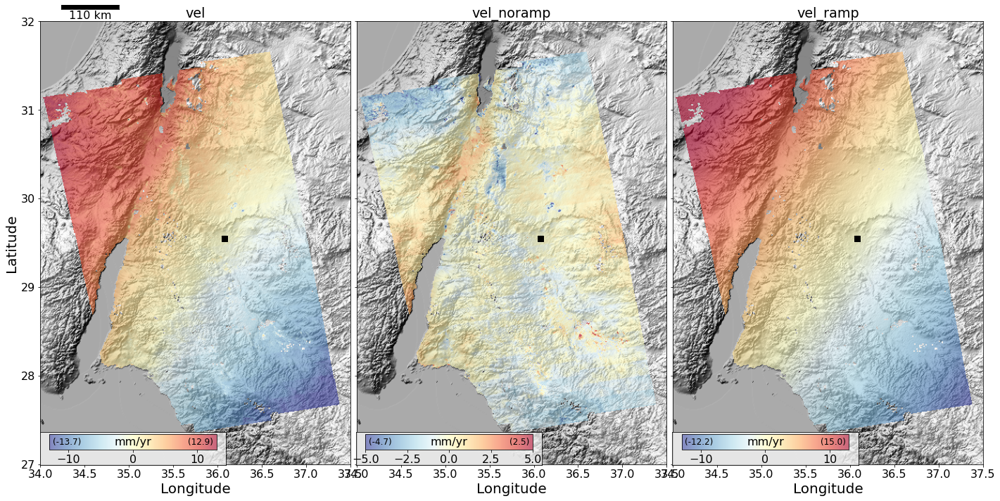

In [3]:
meta      = readfile.read('velocity1.h5', datasetName='velocity')[1]

v = dict()
v['vel']        = read_img('velocity1.h5', maskfile)
v['vel_noramp'] = read_img('velocity1_noramp.h5', maskfile)
v['vel_ramp']   = v['vel'] - v['vel_noramp']

plot_imgs(v, meta, dem_shade, vlims=[[-13, 13],[-5,5],[-13,13]], bbox=[34,37.5,27,32], picdir='./pic', outf='velocity1_info')

save to file: ./pic/velocityIon_info.png


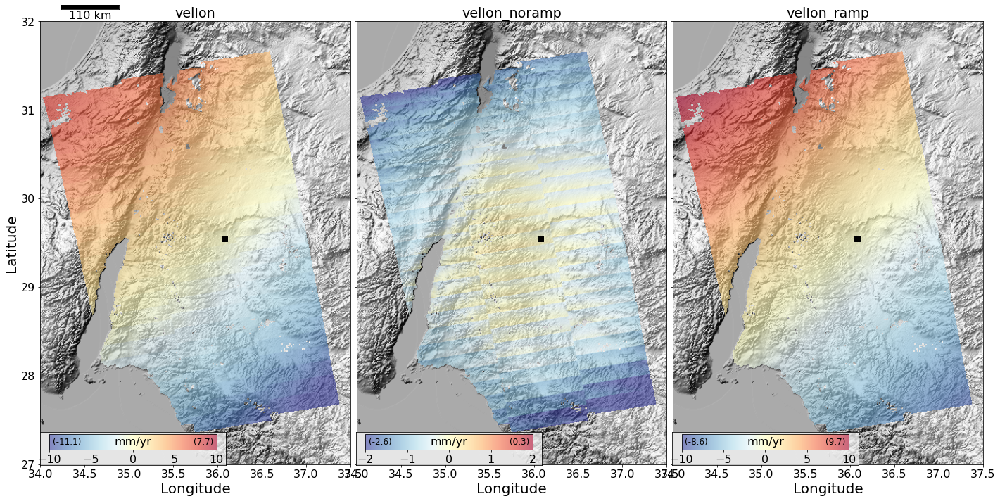

In [4]:
v = dict()
v['velIon']        = read_img('velocityIon.h5', maskfile)
v['velIon_noramp'] = read_img('velocityIon_noramp.h5', maskfile)
v['velIon_ramp']   = v['velIon'] - v['velIon_noramp']

plot_imgs(v, meta, dem_shade, vlims=[[-10, 10],[-2,2],[-10,10]], bbox=[34,37.5,27,32], picdir='./pic', outf='velocityIon_info')

save to file: ./pic/velocityIon_scaled_info.png


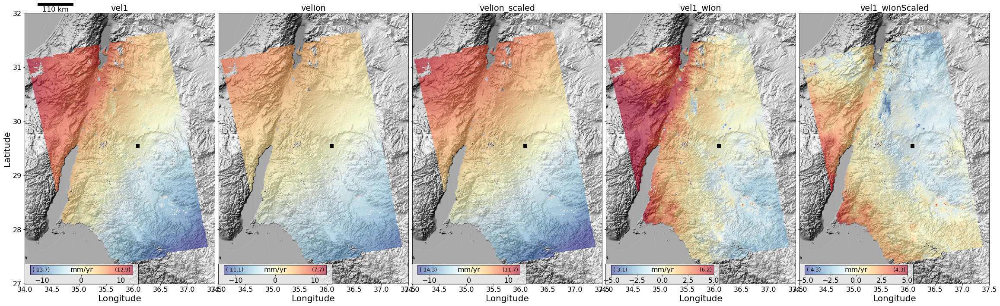

In [5]:
## Maually do something

v = dict()
v['vel1']            = read_img('velocity1.h5', maskfile)
v['velIon']          = read_img('velocityIon.h5', maskfile)
v['velIon_scaled']   = v['velIon']*1.383 + 1.011
v['vel1_wIon']       = v['vel1'] - v['velIon']
v['vel1_wIonScaled'] = v['vel1'] - v['velIon_scaled']

plot_imgs(v, meta, dem_shade, vlims=[[-13, 13]]*3+[[-5,5]]*2, bbox=[34,37.5,27,32], picdir='./pic', outf='velocityIon_scaled_info')

save to file: ./pic/velocityIon_scaled_info.png


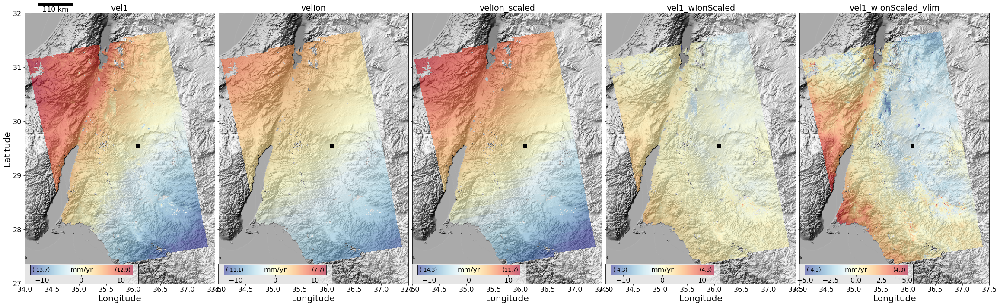

In [6]:
## Do it with output files

v = dict()
v['vel1']            = read_img('velocity1.h5', maskfile)
v['velIon']          = read_img('velocityIon.h5', maskfile)
v['velIon_scaled']   = read_img('velocityIon_scaled.h5', maskfile)
#v['vel1_wIon']       = v['vel1'] - v['velIon']
v['vel1_wIonScaled'] = v['vel1'] - v['velIon_scaled']
v['vel1_wIonScaled_vlim'] = v['vel1'] - v['velIon_scaled']

plot_imgs(v, meta, dem_shade, vlims=[[-13, 13]]*4+[[-5,5]]*1, bbox=[34,37.5,27,32], picdir='./pic', outf='velocityIon_scaled_info')

save to file: ./pic/velocity_orig.png


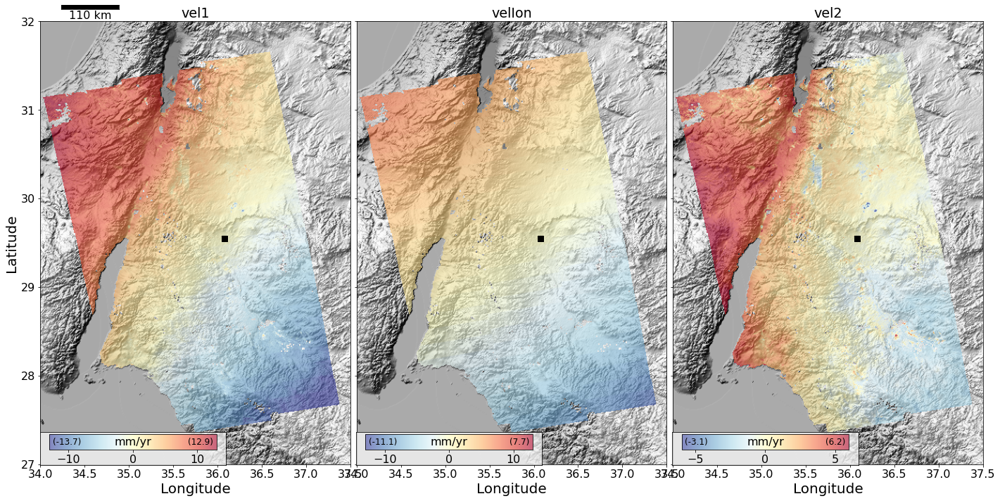

save to file: ./pic/velocity_ramp.png


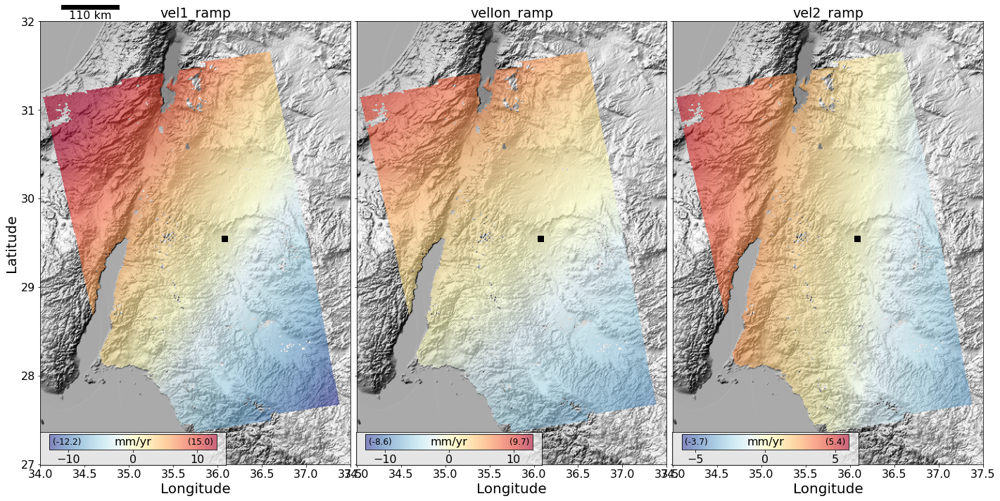

In [7]:
v = dict()
v['vel1']            = read_img('velocity1.h5', maskfile)
v['velIon']          = read_img('velocityIon.h5', maskfile)
v['vel2']            = read_img('velocity2.h5', maskfile)
plot_imgs(v, meta, dem_shade, vlims=[[-13, 13]]*2+[[-6,6]], bbox=[34,37.5,27,32], picdir='./pic', outf='velocity_orig')


v = dict()
v['vel1_ramp']       = read_img('velocity1_ramp.h5', maskfile)
v['velIon_ramp']     = read_img('velocityIon_ramp.h5', maskfile)
v['vel2_ramp']       = read_img('velocity2_ramp.h5', maskfile)
plot_imgs(v, meta, dem_shade, vlims=[[-13, 13]]*2+[[-6,6]], bbox=[34,37.5,27,32], picdir='./pic', outf='velocity_ramp')

coefficient of determination: 0.9420117222818515
slope: 1.383348
intercept: 1.0106827


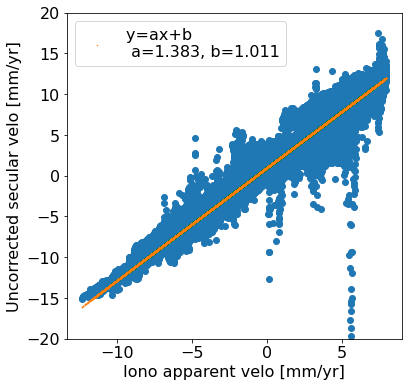

In [8]:
v1   = read_img('velocity1.h5', '../../maskTempCoh_high.h5')
vion = read_img('velocityIon.h5', '../../maskTempCoh_high.h5')

scatter_fields(vion, v1, labels=['Iono apparent velo [mm/yr]', 'Uncorrected secular velo [mm/yr]'], vlim=[-20,20])


coefficient of determination: 0.00488912284541787
slope: -0.14951298
intercept: 0.26923153


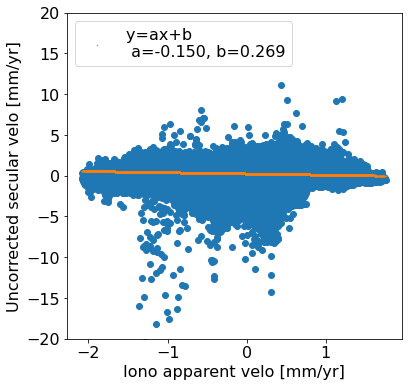

In [9]:
## TopsApp d021

v1_d = read_img('/net/kraken/nobak/ykliu/aqaba/d021/mintpy_new/velocity_out/velocity1.h5', '/net/kraken/nobak/ykliu/aqaba/d021/mintpy_new/maskTempCoh_high.h5')
vion_d = read_img('/net/kraken/nobak/ykliu/aqaba/d021/mintpy_new/velocity_out/velocityIon.h5', '/net/kraken/nobak/ykliu/aqaba/d021/mintpy_new/maskTempCoh_high.h5')

scatter_fields(vion_d, v1_d, labels=['Iono apparent velo [mm/yr]', 'Uncorrected secular velo [mm/yr]'], vlim=[-20,20])

coefficient of determination: 0.0037028984036502344
slope: 0.18693201
intercept: -0.57231414


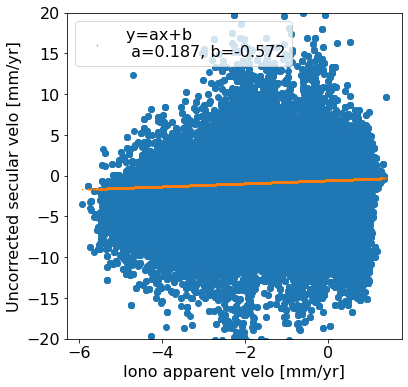

In [10]:
## TopsStack d021

v1_d = read_img('/marmot-nobak/ykliu/aqaba/topsStack/d021/mintpy/velocity_out/velocity1.h5', '/marmot-nobak/ykliu/aqaba/topsStack/d021/mintpy/maskTempCoh_high.h5')
vion_d = read_img('/marmot-nobak/ykliu/aqaba/topsStack/d021/mintpy/velocity_out/velocityIon.h5', '/marmot-nobak/ykliu/aqaba/topsStack/d021/mintpy/maskTempCoh_high.h5')

scatter_fields(vion_d, v1_d, labels=['Iono apparent velo [mm/yr]', 'Uncorrected secular velo [mm/yr]'], vlim=[-20,20])

In [13]:
## Check interferograms
ifstack = '/net/kraken/nobak/ykliu/aqaba/a087/isce/mintpy_new/inputs/ifgramStack.h5'
maskfile = '/net/kraken/nobak/ykliu/aqaba/a087/isce/mintpy_new/maskTempCoh_high.h5'


with open('/net/kraken/nobak/ykliu/aqaba/a087/isce/mintpy_new/inputs/all_dates.txt') as f:
    lines = f.readlines()
    pairs = [line[:-1] for line in lines]

#pairs = ['20161223_20170104', '20170128_20170221', '20170209_20170305', '20170305_20170317', '20180616_20180628']

for pair in pairs:
    igram     = read_stack(ifstack, 'unwrapPhase-'+pair, maskfile)
    igram_ion = read_stack(ifstack,   'ionoPhase-'+pair, maskfile)
    scatter_fields(igram_ion, igram, labels=['Iono phase [mm]', 'Unwrap phase [mm]'], vlim=[None,None], title=pair, savedir='/net/kraken/nobak/ykliu/aqaba/a087/isce/mintpy_new/inputs/phase_corr')
    if False:
        fig, axs = plt.subplots(figsize=[10,10], ncols=2)
        im1 = axs[0].imshow(igram,     cmap='RdYlBu_r')
        im2 = axs[1].imshow(igram_ion, cmap='RdYlBu_r')
        plt.colorbar(im1, ax=axs[0], shrink=0.4)
        plt.colorbar(im2, ax=axs[1], shrink=0.4)
        plt.show()


coefficient of determination: 0.42495913634342974
slope: 0.8069364
intercept: 484978.62
save to file: /net/kraken/nobak/ykliu/aqaba/a087/isce/mintpy_new/inputs/phase_corr/20141011_20141023.png
coefficient of determination: 0.10436517950868263
slope: -0.39295653
intercept: -314518.6
save to file: /net/kraken/nobak/ykliu/aqaba/a087/isce/mintpy_new/inputs/phase_corr/20141011_20141104.png
coefficient of determination: 0.5787041315267109
slope: 0.34842658
intercept: 278762.66
save to file: /net/kraken/nobak/ykliu/aqaba/a087/isce/mintpy_new/inputs/phase_corr/20141023_20141104.png
coefficient of determination: 0.20997344426122677
slope: -0.30097696
intercept: 503299.0
